# Cars4You - Handout Project | Group 42
## Notebook 1 — Models Lab
**Course:** MSc in Data Science and Advanced Analytics, NOVA IMS (2025/2026)  

**Author(s):** Group 42
- `Miguel Matos - 20221925`
- `Andre Nicolau - 20221918`
- `André Ferreira - 20250398`


---

#### <font> Table of Contents </font> <a class="anchor" id='toc'></a> 
1. [Imports](#Imports)  
2. [Modelling Testing](#modelling-testing) 
3. [Random Search](#random-search)
----

# Imports
[Back to TOC](#toc)

In [1]:
from utils.functions import *
from utils.Nuestra_Pipeline import NuestraPipeline
from Preprocessing_pipelines.Outliers_pipeline import OutliersDealer
from Preprocessing_pipelines.Missing_Values_pipeline import MissingValuesDealer
from Preprocessing_pipelines.Encoding_pipeline import EncodingDealer
from Preprocessing_pipelines.Scaling_pipeline import ScalingDealer
from Preprocessing_pipelines.Feature_Selection_pipeline import FeatureSelectionDealer
import warnings

# Suppress this specific warning
warnings.filterwarnings('ignore', 
                       message='X does not have valid feature names',
                       category=UserWarning,
                       module='sklearn.utils.validation')



data = pd.read_csv("../data/data_cleaned.csv", index_col= "carID")
pd.set_option("display.max_columns", None)

In [2]:
data = data.sample(frac=1).reset_index(drop=True)

As the objective is to create a predictive model that is accurate without the need of the mechanic's assessment, we'll drop the "paintQuality%" column.

In [3]:
data.drop("paintQuality%", axis = 1, inplace= True)

In [4]:
X = data.drop("price", axis= 1)
y = data["price"]

# Halving Random Search for parameters tuning

### Random Forest Parameters

In [5]:
rf = RandomForestRegressor(
    n_estimators=100,          # Reduced from 150 for faster training
    max_depth=12,              
    min_samples_split=10,      # Increased to reduce tree complexity
    min_samples_leaf=4,        # Increased to reduce overfitting and speed up
    max_features="sqrt",              
    random_state=42
)

parameters = {
              "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
              "imputer__knn_neighbors": np.arange(5,21),
              "imputer__knn_scaling_method" : ["standard", "minmax", "robust"],
              "outlier_remover__outlier_method" : ["Isolation_Forest", "LOF", "IQR", "z_score"],
              "outlier_remover__mod_outliers_cols" : [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
              "outlier_remover__sev_outliers_cols" : [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
              "outlier_remover__threshold" : [2,3],
              "outlier_remover__z_columns" : [["car_age", "mileage", "tax", "mpg"]],
              "outlier_remover__contamination_IF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
              "outlier_remover__contamination_LOF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__model_columns" : [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
              "encoder__method" : ["target", "freq"],
              "scaler__scaler_name" : ["robust", "minmax", "standard"],
              "selector__selection_method": ["kbest", "model", "rfe"],
              "selector__k": np.arange(5,11),
              "selector__model_name" : ["rf"],
              "selector__n_features_to_select": np.arange(5,11),
              "model": [rf]
    }

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           rf)

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_parameters_rf = HalvingRandomSearchCV(
                                      pipeline, 
                                      parameters,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [6]:
HRS_parameters_rf.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 1/3] END encoder__method=freq, imputer__imputation_method=simple, imputer__knn_neighbors=12, imputer__knn_scaling_method=minmax, model=RandomForestRegressor(max_depth=12, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, random_state=42), outlier_remover__contamination_IF=0.5, outlier_remover__contamination_LOF=0.5, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=70, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_a

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=20, imputer__knn_scaling_method=minmax, model=RandomForestRegressor(max_depth=12, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, random_state=42), outlier_remover__contamination_IF=0.3, outlier_remover__contamination_LOF=0.05, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=50, outlier_remover__outlier_method=IQR, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=10, selector__model_name=rf, selector__n_features_to_select=7, selector__selection_method=rfe;, score=(train=-1590.120, test=-1988.796) total time=   4.6s
[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, i

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([ 5, 6..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [ ]:
rf_params = pd.DataFrame(HRS_parameters_rf.cv_results_)
rf_params.to_csv("../data/final_data/params/RF_params.csv")

joblib.dump(HRS_parameters_rf.best_estimator_, 'models/models_organized/rf_params.pkl')
rf_parameters = joblib.load('models/models_organized/rf_params.pkl')

rf_params.tail()

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_selector__selection_method,param_selector__n_features_to_select,param_selector__model_name,param_selector__k,param_scaler__scaler_name,param_outlier_remover__z_columns,param_outlier_remover__threshold,param_outlier_remover__sev_outliers_cols,param_outlier_remover__outlier_method,param_outlier_remover__n_neighbors,param_outlier_remover__model_columns,param_outlier_remover__mod_outliers_cols,param_outlier_remover__contamination_LOF,param_outlier_remover__contamination_IF,param_model,param_imputer__knn_scaling_method,param_imputer__knn_neighbors,param_imputer__imputation_method,param_encoder__method,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
390,5,64000,4.055881,0.192443,0.927474,0.111634,kbest,6,rf,10,robust,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage, engineSize]",IQR,100,"[car_age, mileage, tax, mpg, engineSize]","[tax, mpg]",0.15,0.30,"RandomForestRegressor(max_depth=12, max_featur...",minmax,6,knn_modelwise,target,"{'selector__selection_method': 'kbest', 'selec...",-1565.969124,-1565.062544,-1589.384607,-1573.472092,11.257933,4,-1405.942203,-1418.080465,-1405.142901,-1409.721857,5.919430
391,5,64000,14.708036,0.074687,0.837991,0.007650,rfe,10,rf,8,robust,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage]",z_score,50,"[tax, mpg]","[car_age, mileage, tax, mpg]",0.05,0.15,"RandomForestRegressor(max_depth=12, max_featur...",standard,8,knn_modelwise,target,"{'selector__selection_method': 'rfe', 'selecto...",-1564.332284,-1565.185372,-1584.736868,-1571.418175,9.424176,3,-1404.766562,-1416.366536,-1394.901336,-1405.344811,8.772665
392,5,64000,15.273278,0.350708,0.862579,0.045224,model,7,rf,10,robust,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",z_score,70,"[tax, mpg]","[tax, mpg]",0.15,0.50,"RandomForestRegressor(max_depth=12, max_featur...",standard,17,knn_modelwise,target,"{'selector__selection_method': 'model', 'selec...",-1568.906437,-1567.144021,-1591.792437,-1575.947632,11.227048,5,-1408.505172,-1422.073656,-1405.290433,-1411.956420,7.273352
393,5,64000,3.742269,0.078249,0.815609,0.027062,kbest,5,rf,10,standard,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage, engineSize]",z_score,100,"[car_age, mileage, tax, mpg, engineSize]","[tax, mpg]",0.50,0.50,"RandomForestRegressor(max_depth=12, max_featur...",robust,8,knn_modelwise,target,"{'selector__selection_method': 'kbest', 'selec...",-1565.923882,-1558.089943,-1584.239028,-1569.417618,10.957442,2,-1404.983435,-1413.872845,-1397.808492,-1405.554924,6.570683
394,5,64000,14.239642,0.458569,0.734437,0.029171,model,8,rf,10,robust,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage, engineSize]",z_score,100,"[car_age, mileage, tax, mpg]","[tax, mpg]",0.50,0.50,"RandomForestRegressor(max_depth=12, max_featur...",robust,13,knn_modelwise,target,"{'selector__selection_method': 'model', 'selec...",-1560.756218,-1560.092813,-1581.089179,-1567.312736,9.745180,1,-1403.279732,-1409.701722,-1396.081843,-1403.021099,5.563299


### Decision Tree Parameters

In [9]:
dt = DecisionTreeRegressor(
    max_depth=10,
    min_samples_split=10,      # Increased for speed
    min_samples_leaf=4,        # Increased for speed
    max_features="sqrt",
    random_state=42
)

parameters = {
              "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
              "imputer__knn_neighbors": np.arange(10,21),
              "imputer__knn_scaling_method" : ["standard", "minmax", "robust"],
              "outlier_remover__outlier_method" : ["Isolation_Forest", "LOF", "IQR", "z_score"],
              "outlier_remover__mod_outliers_cols" : [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
              "outlier_remover__sev_outliers_cols" : [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
              "outlier_remover__threshold" : [2,3],
              "outlier_remover__z_columns" : [["car_age", "mileage", "tax", "mpg"]],
              "outlier_remover__contamination_IF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
              "outlier_remover__contamination_LOF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__model_columns" : [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
              "encoder__method" : ["target", "freq"],
              "scaler__scaler_name" : ["robust", "minmax", "standard"],
              "selector__selection_method": ["kbest", "model", "rfe"],
              "selector__k": np.arange(5,11),
              "selector__model_name" : ["dt"],
              "selector__n_features_to_select": np.arange(5,11),
              "model": [dt]
              }

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           dt)

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_parameters_dt = HalvingRandomSearchCV(
                                      pipeline, 
                                      parameters,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [10]:
HRS_parameters_dt.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits


[CV 1/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=robust, model=DecisionTreeRegressor(max_depth=10, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, random_state=42), outlier_remover__contamination_IF=0.15, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=50, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=7, selector__model_name=dt, selector__n_features_to_select=8, selector__selection_method=rfe;, score=(train=-2622.311, test=-3227.185) total time=   0.1s
[CV 3/3] END encoder__method=target

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 1/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=robust, model=DecisionTreeRegressor(max_depth=10, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, random_state=42), outlier_remover__contamination_IF=0.5, outlier_remover__contamination_LOF=0.3, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['tax', 'mpg'], outlier_remover__n_neighbors=30, outlier_remover__outlier_method=IQR, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=9, selector__model_name=dt, selector__n_features_to_select=7, selector__selection_method=model;, score=(train=-1909.400, test=-2184.892) total time=   0.4s
[CV 2/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=19, impu

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([10, 11..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [ ]:
dt_params = pd.DataFrame(HRS_parameters_dt.cv_results_)
dt_params.to_csv("../data/final_data/HRS_models/params/DT_params.csv")

joblib.dump(HRS_parameters_dt.best_estimator_, 'models/models_organized/dt_params.pkl')
dt_parameters = joblib.load('models/models_organized/dt_params.pkl')

dt_params.tail()

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_selector__selection_method,param_selector__n_features_to_select,param_selector__model_name,param_selector__k,param_scaler__scaler_name,param_outlier_remover__z_columns,param_outlier_remover__threshold,param_outlier_remover__sev_outliers_cols,param_outlier_remover__outlier_method,param_outlier_remover__n_neighbors,param_outlier_remover__model_columns,param_outlier_remover__mod_outliers_cols,param_outlier_remover__contamination_LOF,param_outlier_remover__contamination_IF,param_model,param_imputer__knn_scaling_method,param_imputer__knn_neighbors,param_imputer__imputation_method,param_encoder__method,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
390,5,64000,0.828720,0.153154,0.038911,0.002981,model,7,dt,9,robust,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",IQR,30,"[tax, mpg]","[tax, mpg]",0.30,0.50,"DecisionTreeRegressor(max_depth=10, max_featur...",robust,14,iterative,target,"{'selector__selection_method': 'model', 'selec...",-2056.433941,-2093.500600,-2105.687127,-2085.207223,20.945233,3,-1889.695264,-1938.249578,-1939.204956,-1922.383266,23.117198
391,5,64000,0.627047,0.108738,0.066939,0.025118,kbest,9,dt,9,standard,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",z_score,70,"[car_age, mileage, tax, mpg, engineSize]","[tax, mpg]",0.15,0.50,"DecisionTreeRegressor(max_depth=10, max_featur...",minmax,14,iterative,target,"{'selector__selection_method': 'kbest', 'selec...",-1991.584431,-2053.799696,-2146.727172,-2064.037100,63.749096,2,-1853.138879,-1924.231424,-1973.085433,-1916.818579,49.247718
392,5,64000,1.202900,0.076140,0.035703,0.009087,rfe,9,dt,5,standard,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",IQR,70,"[car_age, mileage, tax, mpg, engineSize]","[car_age, mileage, tax, mpg]",0.50,0.15,"DecisionTreeRegressor(max_depth=10, max_featur...",robust,19,iterative,target,"{'selector__selection_method': 'rfe', 'selecto...",-2033.366634,-2041.096476,-2094.926653,-2056.463254,27.380192,1,-1882.167396,-1902.067622,-1922.068520,-1902.101180,16.289583
393,5,64000,1.662190,0.169700,0.032296,0.002752,rfe,5,dt,7,standard,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage, engineSize]",IQR,30,"[tax, mpg]","[tax, mpg]",0.15,0.15,"DecisionTreeRegressor(max_depth=10, max_featur...",standard,11,iterative,target,"{'selector__selection_method': 'rfe', 'selecto...",-2087.371201,-2061.225370,-2113.008444,-2087.201672,21.140691,4,-1926.161500,-1934.264031,-1937.215420,-1932.546984,4.673220
394,5,64000,1.434996,0.176248,0.024021,0.000584,rfe,5,dt,5,minmax,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",IQR,90,"[car_age, mileage, tax, mpg]","[car_age, mileage, tax, mpg]",0.05,0.50,"DecisionTreeRegressor(max_depth=10, max_featur...",robust,10,iterative,target,"{'selector__selection_method': 'rfe', 'selecto...",-2175.624591,-2111.013928,-2109.691092,-2132.109870,30.774293,6,-2022.678148,-1953.503040,-1940.071400,-1972.084196,36.193123


### Extra Trees Parameters

In [12]:
et = ExtraTreesRegressor(
    n_estimators=100,          # Reduced from 200 for speed with 75k rows
    max_depth=12,
    min_samples_split=10,      # Increased for speed
    min_samples_leaf=4,        # Increased for speed
    max_features="sqrt",
    bootstrap=False,
    n_jobs=-1,                 # Use all CPU cores
    random_state=42
)

parameters = {
              "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
              "imputer__knn_neighbors": np.arange(10,21),
              "imputer__knn_scaling_method" : ["standard", "minmax", "robust"],
              "outlier_remover__outlier_method" : ["Isolation_Forest", "LOF", "IQR", "z_score"],
              "outlier_remover__mod_outliers_cols" : [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
              "outlier_remover__sev_outliers_cols" : [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
              "outlier_remover__threshold" : [2,3],
              "outlier_remover__z_columns" : [["car_age", "mileage", "tax", "mpg"]],
              "outlier_remover__contamination_IF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
              "outlier_remover__contamination_LOF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__model_columns" : [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
              "encoder__method" : ["target", "freq"],
              "scaler__scaler_name" : ["robust", "minmax", "standard"],
              "selector__selection_method": ["kbest", "model", "rfe"],
              "selector__k": np.arange(5,11),
              "selector__model_name" : ["et"],
              "selector__n_features_to_select": np.arange(5,11),
              "model": [et]
              
    }

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           et)

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_parameters_et = HalvingRandomSearchCV(
                                      pipeline, 
                                      parameters,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [13]:
HRS_parameters_et.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 3/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=robust, model=ExtraTreesRegressor(max_depth=12, max_features='sqrt', min_samples_leaf=4,
                    min_samples_split=10, n_jobs=-1, random_state=42), outlier_remover__contamination_IF=0.15, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=50, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_c

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 2/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=16, imputer__knn_scaling_method=robust, model=ExtraTreesRegressor(max_depth=12, max_features='sqrt', min_samples_leaf=4,
                    min_samples_split=10, n_jobs=-1, random_state=42), outlier_remover__contamination_IF=0.15, outlier_remover__contamination_LOF=0.5, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=100, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=minmax, selector__k=10, selector__model_name=et, selector__n_features_to_select=7, selector__selection_method=rfe;, score=(train=-2836.781, test=-2927.358) total time=   0.8s
[CV 1/3] END encoder__method=freq, imputer__imputati

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([10, 11..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [ ]:
et_params = pd.DataFrame(HRS_parameters_et.cv_results_)
et_params.to_csv("../data/final_data/params/ET_params.csv")

joblib.dump(HRS_parameters_et.best_estimator_, 'models/models_organized/et_params.pkl')
et_parameters = joblib.load('models/models_organized/et_params.pkl')

et_params.tail()

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_selector__selection_method,param_selector__n_features_to_select,param_selector__model_name,param_selector__k,param_scaler__scaler_name,param_outlier_remover__z_columns,param_outlier_remover__threshold,param_outlier_remover__sev_outliers_cols,param_outlier_remover__outlier_method,param_outlier_remover__n_neighbors,param_outlier_remover__model_columns,param_outlier_remover__mod_outliers_cols,param_outlier_remover__contamination_LOF,param_outlier_remover__contamination_IF,param_model,param_imputer__knn_scaling_method,param_imputer__knn_neighbors,param_imputer__imputation_method,param_encoder__method,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
390,5,64000,8.254694,0.911967,0.099806,0.017820,model,7,et,9,robust,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",IQR,30,"[tax, mpg]","[tax, mpg]",0.30,0.50,"ExtraTreesRegressor(max_depth=12, max_features...",robust,14,iterative,target,"{'selector__selection_method': 'model', 'selec...",-1936.757579,-1944.765652,-1977.681232,-1953.068154,17.708472,8,-1879.637327,-1897.963865,-1878.679744,-1885.426979,8.873533
391,5,64000,0.405594,0.061081,0.090198,0.032049,kbest,5,et,9,minmax,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage]",z_score,100,"[tax, mpg]","[car_age, mileage, tax, mpg]",0.15,0.05,"ExtraTreesRegressor(max_depth=12, max_features...",minmax,19,simple,target,"{'selector__selection_method': 'kbest', 'selec...",-1912.876590,-1904.263984,-1950.359805,-1922.500126,20.011089,4,-1847.716559,-1846.835112,-1833.003034,-1842.518235,6.737879
392,5,64000,1.140460,0.045095,0.174697,0.047504,kbest,9,et,9,standard,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",z_score,70,"[car_age, mileage, tax, mpg, engineSize]","[tax, mpg]",0.15,0.50,"ExtraTreesRegressor(max_depth=12, max_features...",minmax,14,iterative,target,"{'selector__selection_method': 'kbest', 'selec...",-1893.364248,-1895.697179,-1928.695184,-1905.918870,16.133423,1,-1832.857570,-1839.746862,-1816.258849,-1829.621094,9.858255
393,5,64000,0.584732,0.016521,0.106248,0.028894,kbest,8,et,9,standard,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",IQR,100,"[car_age, mileage, tax, mpg, engineSize]","[car_age, mileage, tax, mpg]",0.05,0.50,"ExtraTreesRegressor(max_depth=12, max_features...",minmax,10,simple,target,"{'selector__selection_method': 'kbest', 'selec...",-1911.898530,-1903.949792,-1929.422126,-1915.090149,10.641108,3,-1841.123532,-1843.086597,-1818.857041,-1834.355723,10.988487
394,5,64000,12.360334,0.121790,0.077927,0.009808,rfe,9,et,5,standard,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",IQR,70,"[car_age, mileage, tax, mpg, engineSize]","[car_age, mileage, tax, mpg]",0.50,0.15,"ExtraTreesRegressor(max_depth=12, max_features...",robust,19,iterative,target,"{'selector__selection_method': 'rfe', 'selecto...",-1894.905083,-1903.041876,-1924.565443,-1907.504134,12.513141,2,-1825.576820,-1850.239781,-1818.716394,-1831.510998,13.536170


### Hist Gradient Boosting Parameters

In [15]:
hgb = HistGradientBoostingRegressor(
    max_iter=100,              
    max_depth=5,               
    learning_rate=0.1,         
    min_samples_leaf=20,       
    max_leaf_nodes=31,         # Controls complexity (2^5 - 1)
    l2_regularization=0.0,     
    random_state=42
)

parameters = {
               "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
               "imputer__knn_neighbors": np.arange(10, 21),
               "imputer__knn_scaling_method": ["standard", "minmax", "robust"],
               "outlier_remover__outlier_method": ["Isolation_Forest", "LOF", "IQR", "z_score"],
               "outlier_remover__mod_outliers_cols": [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
               "outlier_remover__sev_outliers_cols": [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
               "outlier_remover__threshold": [2, 3],
               "outlier_remover__z_columns": [["car_age", "mileage", "tax", "mpg"]],
               "outlier_remover__contamination_IF": [0.05, 0.15, 0.3, 0.5],
               "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
               "outlier_remover__contamination_LOF": [0.05, 0.15, 0.3, 0.5],
               "outlier_remover__model_columns": [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
               "encoder__method": ["target", "freq"],  
               "scaler__scaler_name": ["robust", "minmax", "standard"],
               "selector__selection_method": ["kbest", "model", "rfe"],
               "selector__k": np.arange(5,11),
               "selector__model_name": ["hgb"],
               "selector__n_features_to_select": np.arange(5,11),
               "model": [hgb]
}

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           hgb)

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_parameters_hgb = HalvingRandomSearchCV(
                                      pipeline, 
                                      parameters,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [16]:
HRS_parameters_hgb.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 3/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=robust, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.15, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=50, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 3/3] END encoder__method=target, imputer__imputation_method=knn_modelwise, imputer__knn_neighbors=10, imputer__knn_scaling_method=minmax, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.15, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['tax', 'mpg'], outlier_remover__n_neighbors=30, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=minmax, selector__k=5, selector__model_name=hgb, selector__n_features_to_select=8, selector__selection_method=kbest;, score=(train=-2173.632, test=-2566.442) total time=   0.5s
[CV 2/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=20, imputer__knn_scaling_method=robust, model=HistGradientBoostingRegressor(max_

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
354 fits failed out of a total of 600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
225 fits failed with the following error:
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/miguelmatos/Documents/GitHub/Machine_Learning_project/ML_Project_Group42/notebooks_2nd_delivery/utils/Nuestra_Pipeline.py", line 64, in fit
    X_clean = self.selector.fit_transform(X, y_clean, **kwargs)
              

[CV 2/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=17, imputer__knn_scaling_method=standard, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.05, outlier_remover__contamination_LOF=0.05, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__n_neighbors=90, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=9, selector__model_name=hgb, selector__n_features_to_select=7, selector__selection_method=rfe;, score=(train=nan, test=nan) total time=   0.3s
[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=17, imputer__knn_scaling_method=standard, model=HistGradientBoostingRegressor(ma

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
54 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
33 fits failed with the following error:
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/miguelmatos/Documents/GitHub/Machine_Learning_project/ML_Project_Group42/notebooks_2nd_delivery/utils/Nuestra_Pipeline.py", line 64, in fit
    X_clean = self.selector.fit_transform(X, y_clean, **kwargs)
              ^^

----------
iter: 2
n_candidates: 50
n_resources: 8000
Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=20, imputer__knn_scaling_method=minmax, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.5, outlier_remover__contamination_LOF=0.05, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__n_neighbors=70, outlier_remover__outlier_method=LOF, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=5, selector__model_name=hgb, selector__n_features_to_select=10, selector__selection_method=kbest;, score=(train=-2025.536, test=-2237.611) total time=   0.4s
[CV 2/3] END encoder__method=target, i

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [           nan            nan            nan            nan
 -2384.5953588             nan -2990.1399414             nan
            nan            nan            nan            nan
 -2523.86537974 -3002.35696114 -2920.12349876 -2344.04456644
            nan -2396.20025687            nan            nan
            nan            nan            nan            nan
 -2648.40083851 -2962.5020512             nan            nan
 -2549.82433219            nan -2450.3759424             nan
            nan            nan -2373.38014206            nan
 -2963.27452152 -2534.31755916            nan -2373.38014206
            nan -2893.09570662            nan -2529.15223228
            nan -2640.46497661            nan -3467.77626866
            nan            nan -2550.65004171            nan
            nan -3375.2143

[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=13, imputer__knn_scaling_method=standard, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.3, outlier_remover__contamination_LOF=0.5, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__n_neighbors=30, outlier_remover__outlier_method=z_score, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=6, selector__model_name=hgb, selector__n_features_to_select=10, selector__selection_method=kbest;, score=(train=-1773.356, test=-1883.241) total time=   0.5s
[CV 2/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=13, imputer__knn_scaling_method=standard, model=HistGradientBo

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [           nan            nan            nan            nan
 -2384.5953588             nan -2990.1399414             nan
            nan            nan            nan            nan
 -2523.86537974 -3002.35696114 -2920.12349876 -2344.04456644
            nan -2396.20025687            nan            nan
            nan            nan            nan            nan
 -2648.40083851 -2962.5020512             nan            nan
 -2549.82433219            nan -2450.3759424             nan
            nan            nan -2373.38014206            nan
 -2963.27452152 -2534.31755916            nan -2373.38014206
            nan -2893.09570662            nan -2529.15223228
            nan -2640.46497661            nan -3467.77626866
            nan            nan -2550.65004171            nan
            nan -3375.2143

[CV 3/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=19, imputer__knn_scaling_method=minmax, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.05, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['tax', 'mpg'], outlier_remover__n_neighbors=100, outlier_remover__outlier_method=z_score, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=minmax, selector__k=9, selector__model_name=hgb, selector__n_features_to_select=5, selector__selection_method=kbest;, score=(train=-1668.393, test=-1797.826) total time=   0.5s
[CV 2/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=19, imputer__knn_scaling_method=minmax, model=HistGradientBoostingRegressor(

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [           nan            nan            nan            nan
 -2384.5953588             nan -2990.1399414             nan
            nan            nan            nan            nan
 -2523.86537974 -3002.35696114 -2920.12349876 -2344.04456644
            nan -2396.20025687            nan            nan
            nan            nan            nan            nan
 -2648.40083851 -2962.5020512             nan            nan
 -2549.82433219            nan -2450.3759424             nan
            nan            nan -2373.38014206            nan
 -2963.27452152 -2534.31755916            nan -2373.38014206
            nan -2893.09570662            nan -2529.15223228
            nan -2640.46497661            nan -3467.77626866
            nan            nan -2550.65004171            nan
            nan -3375.2143

[CV 1/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=minmax, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.5, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=70, outlier_remover__outlier_method=z_score, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=standard, selector__k=9, selector__model_name=hgb, selector__n_features_to_select=9, selector__selection_method=kbest;, score=(train=-1626.016, test=-1682.355) total time=   1.8s
[CV 2/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=minmax, mo

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [           nan            nan            nan            nan
 -2384.5953588             nan -2990.1399414             nan
            nan            nan            nan            nan
 -2523.86537974 -3002.35696114 -2920.12349876 -2344.04456644
            nan -2396.20025687            nan            nan
            nan            nan            nan            nan
 -2648.40083851 -2962.5020512             nan            nan
 -2549.82433219            nan -2450.3759424             nan
            nan            nan -2373.38014206            nan
 -2963.27452152 -2534.31755916            nan -2373.38014206
            nan -2893.09570662            nan -2529.15223228
            nan -2640.46497661            nan -3467.77626866
            nan            nan -2550.65004171            nan
            nan -3375.2143

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([10, 11..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [ ]:
hgb_params = pd.DataFrame(HRS_parameters_hgb.cv_results_)
hgb_params.to_csv("../data/final_data/params/HGB_params.csv")

joblib.dump(HRS_parameters_hgb.best_estimator_, 'models/models_organized/hgb_params.pkl')
hgb_parameters = joblib.load('models/models_organized/hgb_params.pkl')

hgb_params.tail()

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_selector__selection_method,param_selector__n_features_to_select,param_selector__model_name,param_selector__k,param_scaler__scaler_name,param_outlier_remover__z_columns,param_outlier_remover__threshold,param_outlier_remover__sev_outliers_cols,param_outlier_remover__outlier_method,param_outlier_remover__n_neighbors,param_outlier_remover__model_columns,param_outlier_remover__mod_outliers_cols,param_outlier_remover__contamination_LOF,param_outlier_remover__contamination_IF,param_model,param_imputer__knn_scaling_method,param_imputer__knn_neighbors,param_imputer__imputation_method,param_encoder__method,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
390,5,64000,1.211178,0.043653,0.091308,0.042548,rfe,10,hgb,5,standard,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage, engineSize]",IQR,100,"[car_age, mileage, tax, mpg]","[tax, mpg]",0.50,0.05,"HistGradientBoostingRegressor(max_depth=5, ran...",robust,18,simple,target,"{'selector__selection_method': 'rfe', 'selecto...",-1679.829502,-1692.920609,-1716.765998,-1696.505370,15.290826,5,-1628.718270,-1647.749104,-1624.319376,-1633.595584,10.167897
391,5,64000,1.891895,0.102615,0.131607,0.028731,rfe,10,hgb,10,robust,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",z_score,50,"[tax, mpg]","[tax, mpg]",0.50,0.50,"HistGradientBoostingRegressor(max_depth=5, ran...",robust,10,iterative,target,"{'selector__selection_method': 'rfe', 'selecto...",-1675.798261,-1695.849412,-1713.058625,-1694.902099,15.226222,4,-1619.685192,-1645.590582,-1621.558931,-1628.944902,11.795104
392,5,64000,2.961779,0.119812,0.881981,0.057853,rfe,10,hgb,6,standard,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage]",IQR,70,"[car_age, mileage, tax, mpg, engineSize]","[car_age, mileage, tax, mpg]",0.15,0.50,"HistGradientBoostingRegressor(max_depth=5, ran...",standard,20,knn_modelwise,target,"{'selector__selection_method': 'rfe', 'selecto...",-1659.757956,-1681.004547,-1689.234356,-1676.665620,12.418649,1,-1604.076510,-1635.557407,-1592.076817,-1610.570245,18.335155
393,5,64000,2.726434,0.195484,0.963798,0.051854,rfe,10,hgb,8,robust,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage]",z_score,50,"[tax, mpg]","[car_age, mileage, tax, mpg]",0.05,0.15,"HistGradientBoostingRegressor(max_depth=5, ran...",standard,13,knn_modelwise,target,"{'selector__selection_method': 'rfe', 'selecto...",-1666.324243,-1675.072015,-1693.593981,-1678.330080,11.368697,2,-1609.233621,-1625.393281,-1596.021917,-1610.216273,12.010925
394,5,64000,2.559890,0.359226,0.773798,0.167734,rfe,10,hgb,6,robust,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage]",IQR,50,"[car_age, mileage, tax, mpg]","[tax, mpg]",0.15,0.30,"HistGradientBoostingRegressor(max_depth=5, ran...",robust,17,knn_modelwise,target,"{'selector__selection_method': 'rfe', 'selecto...",-1670.950411,-1681.459762,-1699.113747,-1683.841307,11.620304,3,-1616.059245,-1635.664364,-1604.766492,-1618.830033,12.765254


### KNeighbours parameters

In [18]:
kn = KNeighborsRegressor(
    n_neighbors=10,           
    weights="distance",        
    algorithm="auto",          
    leaf_size=50,              
    p=2,                       
)

params = {      
              "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
              "imputer__knn_neighbors": np.arange(10,21),
              "imputer__knn_scaling_method" : ["standard", "minmax", "robust"],
              "outlier_remover__outlier_method" : ["Isolation_Forest", "LOF", "IQR", "z_score"],
              "outlier_remover__mod_outliers_cols" : [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
              "outlier_remover__sev_outliers_cols" : [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
              "outlier_remover__threshold" : [2,3],
              "outlier_remover__z_columns" : [["car_age", "mileage", "tax", "mpg"]],
              "outlier_remover__contamination_IF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
              "outlier_remover__contamination_LOF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__model_columns" : [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
              "encoder__method" : ["onehot"],
              "scaler__scaler_name" : ["robust", "minmax", "standard"],
              "selector__selection_method": ["kbest", "model", "rfe"],
              "selector__k": np.arange(5,11),
              "selector__model_name" : ["knn"],
              "selector__n_features_to_select": np.arange(5,11),
              "model": [kn]
    }

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           hgb)

HRS_parameters_kn = HalvingRandomSearchCV(
                                      pipeline, 
                                      parameters,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [21]:
HRS_parameters_kn.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 1/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=robust, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.15, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=50, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
354 fits failed out of a total of 600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
225 fits failed with the following error:
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/miguelmatos/Documents/GitHub/Machine_Learning_project/ML_Project_Group42/notebooks_2nd_delivery/utils/Nuestra_Pipeline.py", line 64, in fit
    X_clean = self.selector.fit_transform(X, y_clean, **kwargs)
              

[CV 3/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=17, imputer__knn_scaling_method=standard, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.05, outlier_remover__contamination_LOF=0.05, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__n_neighbors=90, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=9, selector__model_name=hgb, selector__n_features_to_select=7, selector__selection_method=rfe;, score=(train=nan, test=nan) total time=   0.3s
[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=17, imputer__knn_scaling_method=standard, model=HistGradientBoostingRegressor(ma

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
54 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
33 fits failed with the following error:
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/miguelmatos/Documents/GitHub/Machine_Learning_project/ML_Project_Group42/notebooks_2nd_delivery/utils/Nuestra_Pipeline.py", line 64, in fit
    X_clean = self.selector.fit_transform(X, y_clean, **kwargs)
              ^^

[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=20, imputer__knn_scaling_method=minmax, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.5, outlier_remover__contamination_LOF=0.05, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__n_neighbors=70, outlier_remover__outlier_method=LOF, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=5, selector__model_name=hgb, selector__n_features_to_select=10, selector__selection_method=kbest;, score=(train=-2025.536, test=-2237.611) total time=   0.4s
[CV 2/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=20, imputer__knn_scaling_method=minmax, model=HistGradientB

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [           nan            nan            nan            nan
 -2384.5953588             nan -2990.1399414             nan
            nan            nan            nan            nan
 -2523.86537974 -3002.35696114 -2920.12349876 -2344.04456644
            nan -2396.20025687            nan            nan
            nan            nan            nan            nan
 -2648.40083851 -2962.5020512             nan            nan
 -2549.82433219            nan -2450.3759424             nan
            nan            nan -2373.38014206            nan
 -2963.27452152 -2534.31755916            nan -2373.38014206
            nan -2893.09570662            nan -2529.15223228
            nan -2640.46497661            nan -3467.77626866
            nan            nan -2550.65004171            nan
            nan -3375.2143

[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=13, imputer__knn_scaling_method=standard, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.3, outlier_remover__contamination_LOF=0.5, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__n_neighbors=30, outlier_remover__outlier_method=z_score, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=6, selector__model_name=hgb, selector__n_features_to_select=10, selector__selection_method=kbest;, score=(train=-1773.356, test=-1883.241) total time=   0.4s
[CV 2/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=13, imputer__knn_scaling_method=standard, model=HistGradientBo

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [           nan            nan            nan            nan
 -2384.5953588             nan -2990.1399414             nan
            nan            nan            nan            nan
 -2523.86537974 -3002.35696114 -2920.12349876 -2344.04456644
            nan -2396.20025687            nan            nan
            nan            nan            nan            nan
 -2648.40083851 -2962.5020512             nan            nan
 -2549.82433219            nan -2450.3759424             nan
            nan            nan -2373.38014206            nan
 -2963.27452152 -2534.31755916            nan -2373.38014206
            nan -2893.09570662            nan -2529.15223228
            nan -2640.46497661            nan -3467.77626866
            nan            nan -2550.65004171            nan
            nan -3375.2143

[CV 2/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=19, imputer__knn_scaling_method=minmax, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.05, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['tax', 'mpg'], outlier_remover__n_neighbors=100, outlier_remover__outlier_method=z_score, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=minmax, selector__k=9, selector__model_name=hgb, selector__n_features_to_select=5, selector__selection_method=kbest;, score=(train=-1679.233, test=-1760.776) total time=   0.5s
[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=19, imputer__knn_scaling_method=minmax, model=HistGradientBoostingRegressor(

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [           nan            nan            nan            nan
 -2384.5953588             nan -2990.1399414             nan
            nan            nan            nan            nan
 -2523.86537974 -3002.35696114 -2920.12349876 -2344.04456644
            nan -2396.20025687            nan            nan
            nan            nan            nan            nan
 -2648.40083851 -2962.5020512             nan            nan
 -2549.82433219            nan -2450.3759424             nan
            nan            nan -2373.38014206            nan
 -2963.27452152 -2534.31755916            nan -2373.38014206
            nan -2893.09570662            nan -2529.15223228
            nan -2640.46497661            nan -3467.77626866
            nan            nan -2550.65004171            nan
            nan -3375.2143

[CV 1/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=minmax, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.5, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=70, outlier_remover__outlier_method=z_score, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=standard, selector__k=9, selector__model_name=hgb, selector__n_features_to_select=9, selector__selection_method=kbest;, score=(train=-1626.016, test=-1682.355) total time=   1.3s
[CV 2/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=minmax, mo

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [           nan            nan            nan            nan
 -2384.5953588             nan -2990.1399414             nan
            nan            nan            nan            nan
 -2523.86537974 -3002.35696114 -2920.12349876 -2344.04456644
            nan -2396.20025687            nan            nan
            nan            nan            nan            nan
 -2648.40083851 -2962.5020512             nan            nan
 -2549.82433219            nan -2450.3759424             nan
            nan            nan -2373.38014206            nan
 -2963.27452152 -2534.31755916            nan -2373.38014206
            nan -2893.09570662            nan -2529.15223228
            nan -2640.46497661            nan -3467.77626866
            nan            nan -2550.65004171            nan
            nan -3375.2143

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([10, 11..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [ ]:
kn_params = pd.DataFrame(HRS_parameters_kn.cv_results_)
kn_params.to_csv("../data/final_data/params/KN_params.csv")

joblib.dump(HRS_parameters_kn.best_estimator_, 'models/models_organized/kn_params.pkl')
kn_parameters = joblib.load('models/models_organized/kn_params.pkl')

kn_params.tail()

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_selector__selection_method,param_selector__n_features_to_select,param_selector__model_name,param_selector__k,param_scaler__scaler_name,param_outlier_remover__z_columns,param_outlier_remover__threshold,param_outlier_remover__sev_outliers_cols,param_outlier_remover__outlier_method,param_outlier_remover__n_neighbors,param_outlier_remover__model_columns,param_outlier_remover__mod_outliers_cols,param_outlier_remover__contamination_LOF,param_outlier_remover__contamination_IF,param_model,param_imputer__knn_scaling_method,param_imputer__knn_neighbors,param_imputer__imputation_method,param_encoder__method,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
390,5,64000,1.156432,0.084852,0.051623,0.003603,rfe,10,hgb,5,standard,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage, engineSize]",IQR,100,"[car_age, mileage, tax, mpg]","[tax, mpg]",0.50,0.05,"HistGradientBoostingRegressor(max_depth=5, ran...",robust,18,simple,target,"{'selector__selection_method': 'rfe', 'selecto...",-1679.829502,-1692.920609,-1716.765998,-1696.505370,15.290826,5,-1628.718270,-1647.749104,-1624.319376,-1633.595584,10.167897
391,5,64000,1.647237,0.053987,0.100230,0.006981,rfe,10,hgb,10,robust,"[car_age, mileage, tax, mpg]",2,"[car_age, mileage, engineSize]",z_score,50,"[tax, mpg]","[tax, mpg]",0.50,0.50,"HistGradientBoostingRegressor(max_depth=5, ran...",robust,10,iterative,target,"{'selector__selection_method': 'rfe', 'selecto...",-1675.798261,-1695.849412,-1713.058625,-1694.902099,15.226222,4,-1619.685192,-1645.590582,-1621.558931,-1628.944902,11.795104
392,5,64000,2.646222,0.128422,0.838510,0.106236,rfe,10,hgb,6,standard,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage]",IQR,70,"[car_age, mileage, tax, mpg, engineSize]","[car_age, mileage, tax, mpg]",0.15,0.50,"HistGradientBoostingRegressor(max_depth=5, ran...",standard,20,knn_modelwise,target,"{'selector__selection_method': 'rfe', 'selecto...",-1659.757956,-1681.004547,-1689.234356,-1676.665620,12.418649,1,-1604.076510,-1635.557407,-1592.076817,-1610.570245,18.335155
393,5,64000,2.769997,0.109886,0.860412,0.011658,rfe,10,hgb,8,robust,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage]",z_score,50,"[tax, mpg]","[car_age, mileage, tax, mpg]",0.05,0.15,"HistGradientBoostingRegressor(max_depth=5, ran...",standard,13,knn_modelwise,target,"{'selector__selection_method': 'rfe', 'selecto...",-1666.324243,-1675.072015,-1693.593981,-1678.330080,11.368697,2,-1609.233621,-1625.393281,-1596.021917,-1610.216273,12.010925
394,5,64000,2.453509,0.244793,0.760215,0.137955,rfe,10,hgb,6,robust,"[car_age, mileage, tax, mpg]",3,"[car_age, mileage]",IQR,50,"[car_age, mileage, tax, mpg]","[tax, mpg]",0.15,0.30,"HistGradientBoostingRegressor(max_depth=5, ran...",robust,17,knn_modelwise,target,"{'selector__selection_method': 'rfe', 'selecto...",-1670.950411,-1681.459762,-1699.113747,-1683.841307,11.620304,3,-1616.059245,-1635.664364,-1604.766492,-1618.830033,12.765254


# Halving Random Search for Models Tuning

### Random Forest

In [30]:
rf = RandomForestRegressor()

parameters = [{
              "model": [rf],
                "model__n_estimators": np.arange(50, 501, 10),  # 50-500 step 10 (46 values)
                "model__max_depth": [5, 8, 10, 12, 15, 20, 25, 30, 40, 50, None],  # Including None for unlimited
                "model__min_samples_split": np.arange(2, 101, 2),  # 2-100 step 2 (50 values)
                "model__min_samples_leaf": np.arange(1, 51, 1),  # 1-50 (50 values)
                "model__max_features": ['sqrt', 'log2', 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                "model__max_samples": [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, None],  # Bootstrap sample size
                "model__min_impurity_decrease": [0.0, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.2],
                "model__criterion": ["squared_error", "absolute_error", "friedman_mse", "poisson"],
                "model__bootstrap": [True],  # Whether to use bootstrap samples
                "model__max_leaf_nodes": [None, 50, 100, 200, 500, 1000]  # Alternative to max_depth
                }
           ]

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_rf = HalvingRandomSearchCV(rf_parameters,              
                                parameters,
                                n_candidates=200,            # Good starting point
                                factor=3,                    # Better than 2 - more aggressive filtering
                                min_resources=10000,         # Higher than 2000 for 75k rows
                                max_resources='auto',        # Will use all 75k in final round
                                scoring=mae_scorer, 
                                verbose=3, 
                                cv=3,                        
                                n_jobs= 4,                   # Use all cores, not just 4
                                random_state=42
                            )

In [31]:
HRS_rf.fit(X, y)

n_iterations: 2
n_required_iterations: 5
n_possible_iterations: 2
min_resources_: 10000
max_resources_: 75973
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 200
n_resources: 10000
Fitting 3 folds for each of 200 candidates, totalling 600 fits


[CV 2/3] END model=RandomForestRegressor(), model__bootstrap=True, model__criterion=poisson, model__max_depth=50, model__max_features=0.3, model__max_leaf_nodes=None, model__max_samples=0.3, model__min_impurity_decrease=0.0001, model__min_samples_leaf=1, model__min_samples_split=28, model__n_estimators=50;, score=(train=-1936.893, test=-2128.750) total time=   2.4s
[CV 3/3] END model=RandomForestRegressor(), model__bootstrap=True, model__criterion=poisson, model__max_depth=50, model__max_features=0.3, model__max_leaf_nodes=None, model__max_samples=0.3, model__min_impurity_decrease=0.0001, model__min_samples_leaf=1, model__min_samples_split=28, model__n_estimators=50;, score=(train=-1959.897, test=-2088.819) total time=   2.4s
[CV 1/3] END model=RandomForestRegressor(), model__bootstrap=True, model__criterion=poisson, model__max_depth=50, model__max_features=0.3, model__max_leaf_nodes=None, model__max_samples=0.3, model__min_impurity_decrease=0.0001, model__min_samples_leaf=1, model__mi

,estimator,NuestraPipeli...thod='model'))
,param_distributions,"[{'model': [RandomForestRegressor()], 'model__bootstrap': [True], 'model__criterion': ['squared_error', 'absolute_error', ...], 'model__max_depth': [5, 8, ...], ...}]"
,n_candidates,200
,factor,3
,resource,'n_samples'
,max_resources,'auto'
,min_resources,10000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [ ]:
best_rf = pd.DataFrame(HRS_rf.cv_results_)
best_rf.to_csv("../data/final_data/HRS_models/best_rf.csv")
best_rf.tail()

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__n_estimators,param_model__min_samples_split,param_model__min_samples_leaf,param_model__min_impurity_decrease,param_model__max_samples,param_model__max_leaf_nodes,param_model__max_features,param_model__max_depth,param_model__criterion,param_model__bootstrap,param_model,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
262,1,30000,6.856706,0.040104,0.352330,0.010116,80,36,1,0.001,0.8,500,0.7,40,friedman_mse,True,RandomForestRegressor(),"{'model__n_estimators': 80, 'model__min_sample...",-1672.040963,-1659.665585,-1706.734209,-1679.480252,19.922702,3,-1477.822000,-1490.033109,-1462.831114,-1476.895408,11.124479
263,1,30000,6.776544,0.005903,0.413960,0.004615,180,10,4,0.000,0.8,500,0.2,30,poisson,True,RandomForestRegressor(),"{'model__n_estimators': 180, 'model__min_sampl...",-1748.669006,-1733.470578,-1792.506640,-1758.215408,25.028843,7,-1576.105723,-1593.350529,-1574.170172,-1581.208808,8.621780
264,1,30000,6.421825,0.014363,0.416799,0.004312,160,2,1,0.010,0.4,500,log2,30,poisson,True,RandomForestRegressor(),"{'model__n_estimators': 160, 'model__min_sampl...",-1686.244262,-1668.020519,-1727.298215,-1693.854332,24.791076,4,-1487.362037,-1502.527337,-1484.203728,-1491.364367,7.998027
265,1,30000,380.216985,6.202171,0.536678,0.007277,320,8,2,0.001,0.9,None,sqrt,15,absolute_error,True,RandomForestRegressor(),"{'model__n_estimators': 320, 'model__min_sampl...",-1551.065055,-1545.415786,-1608.013451,-1568.164764,28.271505,1,-1215.572668,-1232.551649,-1219.073381,-1222.399233,7.319718
266,1,30000,16.215755,0.032815,0.674544,0.014069,500,6,2,0.050,0.9,1000,0.6,40,poisson,True,RandomForestRegressor(),"{'model__n_estimators': 500, 'model__min_sampl...",-1566.375787,-1552.596796,-1613.558439,-1577.510341,26.103182,2,-1230.801507,-1249.649432,-1232.147252,-1237.532730,8.585398


Due to fitting time taking too long from the best scoring models, we'll use the second best, as they have similar performances.

In [47]:
best_rf["params"][266]

{'model__n_estimators': 500,
 'model__min_samples_split': 6,
 'model__min_samples_leaf': 2,
 'model__min_impurity_decrease': 0.05,
 'model__max_samples': 0.9,
 'model__max_leaf_nodes': 1000,
 'model__max_features': 0.6,
 'model__max_depth': 40,
 'model__criterion': 'poisson',
 'model__bootstrap': True,
 'model': RandomForestRegressor()}

In [55]:
RF_tuned_params = {'model__n_estimators': 500,
 'model__min_samples_split': 6,
 'model__min_samples_leaf': 2,
 'model__min_impurity_decrease': 0.05,
 'model__max_samples': 0.9,
 'model__max_leaf_nodes': 1000,
 'model__max_features': 0.6,
 'model__max_depth': 40,
 'model__criterion': 'poisson',
 'model__bootstrap': True}

rf_parameters.set_params(**RF_tuned_params)

,imputer,MissingValues...thod='robust')
,outlier_remover,"OutliersDeale...'tax', 'mpg'])"
,encoder,EncodingDeale...thod='target')
,scaler,ScalingDealer()
,selector,FeatureSelect...ethod='model')
,model,RandomForestR...ndom_state=42)
,q,10
,method,'target'
,cols,None
,handle_unknown,'ignore'
,min_freq,0


In [14]:
#joblib.dump(rf_parameters, 'models/models_organized/models_tuning/rf_tuned.pkl')
RF_tuned = joblib.load('models/models_organized/models_tuning/rf_tuned.pkl')

### Decision Tree

In [33]:
dt = DecisionTreeRegressor()

parameters = {
              "model": [dt],
              "model__max_depth": [10, 15, 20, 25, 30],  # Control tree depth
              "model__min_samples_split": [20, 50, 100, 200],  # Higher for large dataset
              "model__min_samples_leaf": [10, 20, 50, 100],  # Prevent tiny leaves
              "model__max_features": ["sqrt", "log2", 0.5, 0.7, None],  # Feature sampling
              "model__splitter": ["best", "random"],  # Splitting strategy
              "model__min_impurity_decrease": [0.0, 0.0001, 0.001, 0.01],  # Pruning threshold
              "model__ccp_alpha": [0.0, 0.001, 0.01, 0.1]
              }

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_dt = HalvingRandomSearchCV(dt_parameters, 
                                        parameters,
                                        n_candidates=200,            # Good starting point
                                        factor=3,                    # Better than 2 - more aggressive filtering
                                        min_resources=10000,         # Higher than 2000 for 75k rows
                                        max_resources='auto',        # Will use all 75k in final round
                                        scoring=mae_scorer, 
                                        verbose=3, 
                                        cv=3,                        
                                        n_jobs= 4,                   # Use all cores, not just 4
                                        random_state=42
                            )

In [34]:
HRS_dt.fit(X, y)

n_iterations: 2
n_required_iterations: 5
n_possible_iterations: 2
min_resources_: 10000
max_resources_: 75973
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 200
n_resources: 10000
Fitting 3 folds for each of 200 candidates, totalling 600 fits


[CV 1/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.01, model__max_depth=30, model__max_features=None, model__min_impurity_decrease=0.01, model__min_samples_leaf=50, model__min_samples_split=200, model__splitter=best;, score=(train=-2523.554, test=-2598.202) total time=   0.2s
[CV 1/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.001, model__max_depth=25, model__max_features=sqrt, model__min_impurity_decrease=0.0001, model__min_samples_leaf=50, model__min_samples_split=100, model__splitter=random;, score=(train=-3778.772, test=-3777.854) total time=   0.2s
[CV 2/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.001, model__max_depth=25, model__max_features=sqrt, model__min_impurity_decrease=0.0001, model__min_samples_leaf=50, model__min_samples_split=100, model__splitter=random;, score=(train=-3626.770, test=-3703.612) total time=   0.2s
[CV 3/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.001, model__max_depth=25, model__max_features=sqrt, model__m

,estimator,NuestraPipeli...method='rfe'))
,param_distributions,"{'model': [DecisionTreeRegressor()], 'model__ccp_alpha': [0.0, 0.001, ...], 'model__max_depth': [10, 15, ...], 'model__max_features': ['sqrt', 'log2', ...], ...}"
,n_candidates,200
,factor,3
,resource,'n_samples'
,max_resources,'auto'
,min_resources,10000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [ ]:
best_dt = pd.DataFrame(HRS_dt.cv_results_)
best_dt.to_csv("../data/final_data/HRS_models/best_dt.csv")
best_dt.tail()

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__splitter,param_model__min_samples_split,param_model__min_samples_leaf,param_model__min_impurity_decrease,param_model__max_features,param_model__max_depth,param_model__ccp_alpha,param_model,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
262,1,30000,0.449539,0.013331,0.021500,0.005120,best,20,10,0.010,0.7,20,0.001,DecisionTreeRegressor(),"{'model__splitter': 'best', 'model__min_sample...",-1945.194225,-1930.032693,-1971.192138,-1948.806352,16.996285,7,-1536.218496,-1600.712666,-1558.225290,-1565.052151,26.768501
263,1,30000,0.456681,0.011868,0.018380,0.002777,best,20,20,0.000,None,25,0.001,DecisionTreeRegressor(),"{'model__splitter': 'best', 'model__min_sample...",-1938.016178,-1908.773026,-1961.632432,-1936.140546,21.620480,2,-1709.327465,-1701.492978,-1689.323290,-1700.047911,8.230347
264,1,30000,0.452356,0.016479,0.016807,0.001629,best,20,20,0.000,None,30,0.000,DecisionTreeRegressor(),"{'model__splitter': 'best', 'model__min_sample...",-1938.016178,-1908.773026,-1961.632432,-1936.140546,21.620480,2,-1709.327465,-1701.492978,-1689.323290,-1700.047911,8.230347
265,1,30000,0.453715,0.001426,0.021029,0.004925,best,50,10,0.001,None,30,0.001,DecisionTreeRegressor(),"{'model__splitter': 'best', 'model__min_sample...",-1924.322475,-1905.047297,-1926.444350,-1918.604707,9.625595,1,-1651.787636,-1671.962684,-1640.892149,-1654.880823,12.871685
266,1,30000,0.438471,0.005253,0.017985,0.002427,best,20,10,0.001,0.7,30,0.100,DecisionTreeRegressor(),"{'model__splitter': 'best', 'model__min_sample...",-1921.470917,-1964.956054,-1933.445379,-1939.957450,18.340203,4,-1553.936945,-1613.313302,-1528.192861,-1565.147703,35.642981


The best model in this run is the best estimator.

In [ ]:
#joblib.dump(HRS_dt.best_estimator_, 'models/models_organized/models_tuning/dt_tuned.pkl')
DT_tuned = joblib.load('models/models_organized/models_tuning/dt_tuned.pkl')

### Extra Trees

In [36]:
et = ExtraTreesRegressor()

parameters = {
              "model": [et],
              "model__criterion": ["squared_error", "absolute_error"],
              "model__n_estimators": np.arange(100, 800, 50), # ExtraTrees is fast → you can afford many trees
              "model__max_depth": np.arange(20, 100, 20), # Depth: allow fully grown + several controlled-depth options
              "model__max_features": ["sqrt", "log2", 0.3, 0.5, 0.8, 1.0], # Max features for ExtraTrees (random splits)
              "model__min_impurity_decrease": [0.0, 1e-4, 1e-3, 1e-2],  # Encourage pruning of bad splits
              "model__min_samples_split": np.arange(2, 100, 10),   # With your big dataset, larger splits help generalization    
              "model__min_samples_leaf": np.arange(1, 40, 4),   # Adds strong smoothing for regression
              "model__bootstrap": [False, True],   # ExtraTrees usually does NOT use bootstrap—but we let the search try it
              "model__max_samples": [0.5, 0.7, 0.9, None]   # If bootstrap=True, this is used. Otherwise it is ignored.    
    }

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_et = HalvingRandomSearchCV(et_parameters, 
                                      parameters,
                                n_candidates=200,            # Good starting point
                                factor=3,                    # Better than 2 - more aggressive filtering
                                min_resources=10000,         # Higher than 2000 for 75k rows
                                max_resources='auto',        # Will use all 75k in final round
                                scoring=mae_scorer, 
                                verbose=3, 
                                cv=3,                        
                                n_jobs= 4,                   # Use all cores, not just 4
                                random_state=42
                            )

In [37]:
HRS_et.fit(X, y)

n_iterations: 2
n_required_iterations: 5
n_possible_iterations: 2
min_resources_: 10000
max_resources_: 75973
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 200
n_resources: 10000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 1/3] END model=ExtraTreesRegressor(), model__bootstrap=False, model__criterion=squared_error, model__max_depth=20, model__max_features=0.8, model__max_samples=None, model__min_impurity_decrease=0.001, model__min_samples_leaf=29, model__min_samples_split=62, model__n_estimators=300;, score=(train=-2117.930, test=-2155.589) total time=   0.9s
[CV 2/3] END model=ExtraTreesRegressor(), model__bootstrap=False, model__criterion=squared_error, model__max_depth=20, model__max_features=0.8, model__max_samples=None, model__min_impurity_decrease=0.001, model__min_samples_leaf=29, model__min_samples_split=62, model__n_estimators=300;, score=(train=-2107.085, test=-2248.493) total time=   0.9s
[CV 3/3] END model=ExtraTreesRegresso

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
195 fits failed out of a total of 600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
195 fits failed with the following error:
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/miguelmatos/Documents/GitHub/Machine_Learning_project/ML_Project_Group42/notebooks_2nd_delivery/utils/Nuestra_Pipeline.py", line 72, in fit
    self.model_.fit(X_clean, y_clean, sample_weight = sample_weights)
  File "

[CV 1/3] END model=ExtraTreesRegressor(), model__bootstrap=True, model__criterion=squared_error, model__max_depth=60, model__max_features=1.0, model__max_samples=0.7, model__min_impurity_decrease=0.001, model__min_samples_leaf=37, model__min_samples_split=22, model__n_estimators=150;, score=(train=-2034.061, test=-2069.751) total time=   1.0s
[CV 2/3] END model=ExtraTreesRegressor(), model__bootstrap=True, model__criterion=squared_error, model__max_depth=60, model__max_features=1.0, model__max_samples=0.7, model__min_impurity_decrease=0.001, model__min_samples_leaf=37, model__min_samples_split=22, model__n_estimators=150;, score=(train=-2030.489, test=-2040.670) total time=   1.1s
[CV 3/3] END model=ExtraTreesRegressor(), model__bootstrap=True, model__criterion=squared_error, model__max_depth=60, model__max_features=1.0, model__max_samples=0.7, model__min_impurity_decrease=0.001, model__min_samples_leaf=37, model__min_samples_split=22, model__n_estimators=150;, score=(train=-2025.125, 

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 2/3] END model=ExtraTreesRegressor(), model__bootstrap=False, model__criterion=squared_error, model__max_depth=20, model__max_features=log2, model__max_samples=None, model__min_impurity_decrease=0.0, model__min_samples_leaf=5, model__min_samples_split=2, model__n_estimators=750;, score=(train=-1603.531, test=-1752.936) total time=   5.0s
[CV 3/3] END model=ExtraTreesRegressor(), model__bootstrap=False, model__criterion=squared_error, model__max_depth=20, model__max_features=log2, model__max_samples=None, model__min_impurity_decrease=0.0, model__min_samples_leaf=5, model__min_samples_split=2, model__n_estimators=750;, score=(train=-1593.754, test=-1810.875) total time=   5.1s
[CV 3/3] END model=ExtraTreesRegressor(), model__bootstrap=False, model__criterion=absolute_error, model__max_depth=80, model__max_features=log2, model__max_samples=None, model__min_impurity_decrease=0.01, model__min_samples_leaf=5, model__min_samples_split=2, model__n_estimators=400;, score=(train=-1630.271, t

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [-2005.08939674 -2192.54777228            nan -2256.1219849
 -2401.67812731 -2868.45437044 -2686.41869317            nan
 -2115.79641164            nan            nan -2885.31157599
 -2229.34504517            nan -2689.98069607            nan
            nan -3208.58966047 -2567.60608903 -2111.19532422
            nan -2389.59617977 -1806.84805388 -2332.87973492
 -2247.12577058            nan            nan -2270.44343574
 -2193.92686257 -2957.51536396 -2236.30982037            nan
 -2780.73748058            nan -2213.22302413 -2382.62071425
            nan -2091.00118712            nan -2237.23390596
            nan -2876.92576611 -2194.49770052 -2862.78859842
 -2367.61873173 -2127.13436321 -2573.32822712 -2309.53126148
 -2725.87311883            nan -2547.20243071 -2746.61976319
 -2771.08043332            

,estimator,NuestraPipeli...thod='kbest'))
,param_distributions,"{'model': [ExtraTreesRegressor()], 'model__bootstrap': [False, True], 'model__criterion': ['squared_error', 'absolute_error'], 'model__max_depth': array([20, 40, 60, 80]), ...}"
,n_candidates,200
,factor,3
,resource,'n_samples'
,max_resources,'auto'
,min_resources,10000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [ ]:
best_et = pd.DataFrame(HRS_et.cv_results_)
best_et.to_csv("../data/final_data/HRS_models/best_et.csv")
best_et.tail()

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__n_estimators,param_model__min_samples_split,param_model__min_samples_leaf,param_model__min_impurity_decrease,param_model__max_samples,param_model__max_features,param_model__max_depth,param_model__criterion,param_model__bootstrap,param_model,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
262,1,30000,3.430462,0.010315,0.572235,0.002356,700,2,5,0.001,0.5,0.8,20,squared_error,True,ExtraTreesRegressor(),"{'model__n_estimators': 700, 'model__min_sampl...",-1730.024879,-1714.236563,-1766.572108,-1736.944517,21.918993,5,-1578.649771,-1590.480422,-1575.320642,-1581.483612,6.505266
263,1,30000,2.644496,0.026298,0.502835,0.002632,450,22,1,0.010,None,0.3,40,squared_error,False,ExtraTreesRegressor(),"{'model__n_estimators': 450, 'model__min_sampl...",-1691.661588,-1681.162658,-1736.028963,-1702.951070,23.779082,4,-1441.851195,-1454.884860,-1436.848467,-1444.528174,7.602742
264,1,30000,161.514265,0.153370,0.290326,0.000181,300,12,1,0.010,0.5,0.8,80,absolute_error,True,ExtraTreesRegressor(),"{'model__n_estimators': 300, 'model__min_sampl...",-1617.836503,-1612.002685,-1665.859459,-1631.899549,24.131100,3,-1378.992487,-1384.841397,-1374.940259,-1379.591381,4.064246
265,1,30000,2419.725287,6.133995,0.724813,0.015814,700,22,1,0.010,None,0.8,60,absolute_error,False,ExtraTreesRegressor(),"{'model__n_estimators': 700, 'model__min_sampl...",-1558.671959,-1546.019848,-1613.845488,-1572.845765,29.447715,2,-1199.674986,-1200.572332,-1192.748882,-1197.665400,3.495751
266,1,30000,656.725320,0.889124,0.489185,0.002510,450,12,1,0.010,0.9,1.0,60,absolute_error,True,ExtraTreesRegressor(),"{'model__n_estimators': 450, 'model__min_sampl...",-1557.735819,-1543.883829,-1610.993667,-1570.871105,28.929044,1,-1203.223176,-1201.498022,-1195.382420,-1200.034539,3.364095


As the three models ranked as best take too long to run and seem to overfit, we'll keep the model ranked as 5, as it's faster and also overfits less.

In [53]:
best_et["params"][262]

{'model__n_estimators': 700,
 'model__min_samples_split': 2,
 'model__min_samples_leaf': 5,
 'model__min_impurity_decrease': 0.001,
 'model__max_samples': 0.5,
 'model__max_features': 0.8,
 'model__max_depth': 20,
 'model__criterion': 'squared_error',
 'model__bootstrap': True,
 'model': ExtraTreesRegressor()}

In [57]:
ET_tuned_params = {'model__n_estimators': 500,
 'model__min_samples_split': 6,
 'model__min_samples_leaf': 2,
 'model__min_impurity_decrease': 0.05,
 'model__max_samples': 0.9,
 'model__max_leaf_nodes': 1000,
 'model__max_features': 0.6,
 'model__max_depth': 40,
 'model__criterion': 'poisson',
 'model__bootstrap': True}

et_parameters.set_params(**ET_tuned_params)

,imputer,MissingValues...thod='minmax')
,outlier_remover,"OutliersDeale...'tax', 'mpg'])"
,encoder,EncodingDeale...thod='target')
,scaler,ScalingDealer...me='standard')
,selector,FeatureSelect...ethod='kbest')
,model,ExtraTreesReg...ndom_state=42)
,q,10
,method,'target'
,cols,None
,handle_unknown,'ignore'
,min_freq,0


In [ ]:
#joblib.dump(et_parameters, 'models/models_organized/models_tuning/et_tuned.pkl')
ET_tuned = joblib.load('models/models_organized/models_tuning/et_tuned.pkl')

### Hist Gradient Boosting

In [39]:
hgb = HistGradientBoostingRegressor()

parameters = {
    
            "model": [hgb],
            "model__max_iter": [50, 100, 150, 200],              # Number of boosting iterations
            "model__max_depth": [3, 4, 5, 7, None],              # Tree depth (None = unlimited)
            "model__learning_rate": [0.01, 0.05, 0.1, 0.2],      # Step size
            "model__min_samples_leaf": [10, 20, 50, 100],        # Min samples in leaf
            "model__max_leaf_nodes": [15, 31, 63, None],         # Max leaves (2^k - 1 is typical)
            "model__l2_regularization": [0.0, 0.1, 1.0, 10.0],   # L2 penalty
            "model__max_bins": [128, 255]                        # Bins for histogram (255 is default)
}


mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_hgb = HalvingRandomSearchCV(hgb_parameters, 
                                      parameters,
                                n_candidates=200,            # Good starting point
                                factor=3,                    # Better than 2 - more aggressive filtering
                                min_resources=10000,         # Higher than 2000 for 75k rows
                                max_resources='auto',        # Will use all 75k in final round
                                scoring=mae_scorer, 
                                verbose=3, 
                                cv=3,                        
                                n_jobs= 4,                   # Use all cores, not just 4
                                random_state=42
                            )

In [40]:
HRS_hgb.fit(X, y)

n_iterations: 2
n_required_iterations: 5
n_possible_iterations: 2
min_resources_: 10000
max_resources_: 75973
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 200
n_resources: 10000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 1/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=0.1, model__learning_rate=0.1, model__max_bins=128, model__max_depth=3, model__max_iter=50, model__max_leaf_nodes=15, model__min_samples_leaf=50;, score=(train=-2050.944, test=-2137.227) total time=   1.0s
[CV 2/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=0.1, model__learning_rate=0.1, model__max_bins=128, model__max_depth=3, model__max_iter=50, model__max_leaf_nodes=15, model__min_samples_leaf=50;, score=(train=-2078.445, test=-2268.303) total time=   1.1s
[CV 3/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=0.1, model__learning_rate=0.1, model__max_bins=128, model__max_depth=3, model__max_iter=

,estimator,NuestraPipeli...method='rfe'))
,param_distributions,"{'model': [HistGradientB...ingRegressor()], 'model__l2_regularization': [0.0, 0.1, ...], 'model__learning_rate': [0.01, 0.05, ...], 'model__max_bins': [128, 255], ...}"
,n_candidates,200
,factor,3
,resource,'n_samples'
,max_resources,'auto'
,min_resources,10000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [63]:
best_hgb = pd.DataFrame(HRS_hgb.cv_results_)
best_hgb.to_csv("../data/final_data/HRS_models/best_hgb.csv")
best_hgb.sort_values(by="rank_test_score", ascending= False).tail(10)

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__min_samples_leaf,param_model__max_leaf_nodes,param_model__max_iter,param_model__max_depth,param_model__max_bins,param_model__learning_rate,param_model__l2_regularization,param_model,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
263,1,30000,1.960139,0.134843,0.347092,0.022756,10,63,150,7,255,0.1,1.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1577.130437,-1592.178697,-1610.235110,-1593.181415,13.533512,10,-1377.101420,-1391.124998,-1298.006331,-1355.410916,40.992926
264,1,30000,1.863379,0.103340,0.366904,0.010331,10,None,150,7,128,0.1,1.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1568.092713,-1572.272079,-1630.027863,-1590.130885,28.262973,9,-1284.233728,-1363.728525,-1358.172077,-1335.378110,36.235612
241,1,30000,2.759762,0.202574,0.491879,0.075607,50,None,150,None,128,0.2,0.1,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 50, 'model__max_le...",-1598.324473,-1568.520432,-1599.523099,-1588.789335,14.340630,8,-1028.293373,-1084.872727,-1045.801026,-1052.989042,23.651025
247,1,30000,2.213838,0.014345,0.416923,0.079281,50,63,150,None,128,0.1,0.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 50, 'model__max_le...",-1577.020675,-1564.524419,-1619.094237,-1586.879777,23.343346,7,-1332.691150,-1341.889704,-1333.237788,-1335.939547,4.213311
257,1,30000,1.675081,0.011354,0.390761,0.017955,10,63,100,7,128,0.2,1.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1572.267920,-1562.933027,-1620.830548,-1585.343832,25.380640,6,-1241.925263,-1267.585678,-1249.100951,-1252.870631,10.809628
252,1,30000,9.818226,3.950482,0.497012,0.067368,10,None,200,None,128,0.1,10.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1585.959361,-1523.895725,-1604.964827,-1571.606638,34.617436,5,-558.439207,-980.503642,-559.704872,-699.549241,198.665435
239,1,30000,4.550370,0.565652,0.369982,0.046286,10,None,200,None,128,0.2,10.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1559.670567,-1544.750015,-1591.843452,-1565.421345,19.651150,4,-719.484588,-838.488718,-686.344260,-748.105856,65.326701
266,1,30000,1.624236,0.184595,0.355223,0.069035,10,63,200,7,255,0.1,1.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1523.293268,-1583.610846,-1589.320490,-1565.408201,29.870841,3,-1219.467514,-1413.784446,-1239.862097,-1291.038019,87.193267
259,1,30000,5.188095,0.429010,0.486762,0.062837,20,None,150,None,128,0.1,10.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 20, 'model__max_le...",-1565.379737,-1525.533126,-1582.286497,-1557.733120,23.792006,2,-875.868166,-902.752167,-939.786377,-906.135570,26.203944
265,1,30000,6.825542,1.458976,0.381607,0.041233,10,None,100,None,255,0.1,10.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1541.482490,-1536.129063,-1562.740333,-1546.783962,11.492581,1,-702.378627,-741.231400,-936.785663,-793.465230,102.576620


Most of the models overfit by a lot, and as the one that overfits the less and still performs well is the 7th, we'll keep that one.

In [64]:
best_hgb["params"][247]

{'model__min_samples_leaf': 50,
 'model__max_leaf_nodes': 63,
 'model__max_iter': 150,
 'model__max_depth': None,
 'model__max_bins': 128,
 'model__learning_rate': 0.1,
 'model__l2_regularization': 0.0,
 'model': HistGradientBoostingRegressor()}

In [65]:
HGB_tuned_params = {'model__min_samples_leaf': 50,
 'model__max_leaf_nodes': 63,
 'model__max_iter': 150,
 'model__max_depth': None,
 'model__max_bins': 128,
 'model__learning_rate': 0.1,
 'model__l2_regularization': 0.0}

hgb_parameters.set_params(**HGB_tuned_params)

,imputer,MissingValues..._neighbors=20)
,outlier_remover,"OutliersDeale...'tax', 'mpg'])"
,encoder,EncodingDeale...thod='target')
,scaler,ScalingDealer...me='standard')
,selector,FeatureSelect..._method='rfe')
,model,HistGradientB...ndom_state=42)
,q,10
,method,'target'
,cols,None
,handle_unknown,'ignore'
,min_freq,0


In [ ]:
#joblib.dump(hgb_parameters, 'models/models_organized/models_tuning/hgb_tuned.pkl')
HGB_tuned = joblib.load('models/models_organized/models_tuning/hgb_tuned.pkl')

### KNeighbours

In [42]:
kn = KNeighborsRegressor()

params = {      
              "model": [kn],
              "model__n_neighbors": [5, 10, 15, 20, 30, 50, 75, 100],  # Number of neighbors
              "model__weights": ["uniform", "distance"],  # Weighting scheme
              "model__algorithm": ["auto", "ball_tree", "kd_tree"],  # Search algorithm
              "model__leaf_size": np.arange(20,50,5),  # Affects speed (only for ball/kd tree)
              "model__p": [1, 2]  # Distance metric: 1=Manhattan, 2=Euclidean
    }
    
HRS_kn = HalvingRandomSearchCV(kn_parameters, 
                                      parameters,
                                n_candidates=200,            # Good starting point
                                factor=3,                    # Better than 2 - more aggressive filtering
                                min_resources=10000,         # Higher than 2000 for 75k rows
                                max_resources='auto',        # Will use all 75k in final round
                                scoring=mae_scorer, 
                                verbose=3, 
                                cv=3,                        
                                n_jobs= 4,                   # Use all cores, not just 4
                                random_state=42
                            )

In [43]:
HRS_kn.fit(X.iloc[:30000,], y.iloc[:30000,])

n_iterations: 2
n_required_iterations: 5
n_possible_iterations: 2
min_resources_: 10000
max_resources_: 30000
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 200
n_resources: 10000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 3/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=0.1, model__learning_rate=0.1, model__max_bins=128, model__max_depth=3, model__max_iter=50, model__max_leaf_nodes=15, model__min_samples_leaf=50;, score=(train=-2065.764, test=-2213.587) total time=   1.0s
[CV 1/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=0.1, model__learning_rate=0.1, model__max_bins=128, model__max_depth=3, model__max_iter=50, model__max_leaf_nodes=15, model__min_samples_leaf=50;, score=(train=-2083.917, test=-2142.949) total time=   1.0s
[CV 2/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=0.1, model__learning_rate=0.1, model__max_bins=128, model__max_depth=3, model__max_iter=

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 2/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=0.1, model__learning_rate=0.1, model__max_bins=128, model__max_depth=5, model__max_iter=100, model__max_leaf_nodes=None, model__min_samples_leaf=20;, score=(train=-1607.934, test=-1738.551) total time=   1.8s
[CV 3/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=0.1, model__learning_rate=0.1, model__max_bins=128, model__max_depth=5, model__max_iter=100, model__max_leaf_nodes=None, model__min_samples_leaf=20;, score=(train=-1624.394, test=-1738.175) total time=   1.8s
[CV 1/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=10.0, model__learning_rate=0.2, model__max_bins=128, model__max_depth=7, model__max_iter=50, model__max_leaf_nodes=None, model__min_samples_leaf=50;, score=(train=-1576.305, test=-1682.682) total time=   1.8s
[CV 2/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=10.0, model__learning_rate=0.2, model__max_bins=128, model__max_d

,estimator,NuestraPipeli...method='rfe'))
,param_distributions,"{'model': [HistGradientB...ingRegressor()], 'model__l2_regularization': [0.0, 0.1, ...], 'model__learning_rate': [0.01, 0.05, ...], 'model__max_bins': [128, 255], ...}"
,n_candidates,200
,factor,3
,resource,'n_samples'
,max_resources,'auto'
,min_resources,10000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [67]:
best_kn = pd.DataFrame(HRS_kn.cv_results_)
best_kn.to_csv("../data/final_data/HRS_models/best_kn.csv")
best_kn.sort_values(by="rank_test_score", ascending= False).tail(10)

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__min_samples_leaf,param_model__max_leaf_nodes,param_model__max_iter,param_model__max_depth,param_model__max_bins,param_model__learning_rate,param_model__l2_regularization,param_model,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
255,1,30000,2.012071,0.150788,0.429848,0.026286,50,63,150,None,128,0.1,0.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 50, 'model__max_le...",-1556.962465,-1594.456246,-1625.969897,-1592.462869,28.207405,10,-1354.004472,-1332.603220,-1379.770008,-1355.459233,19.283218
260,1,30000,1.837033,0.159885,0.389170,0.048196,10,None,150,7,128,0.1,1.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1569.705539,-1606.704650,-1594.237873,-1590.216021,15.370210,9,-1374.418560,-1340.907972,-1272.905126,-1329.410553,42.232589
257,1,30000,2.899964,0.328063,0.467256,0.035817,20,None,50,None,128,0.2,0.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 20, 'model__max_le...",-1562.641584,-1589.428082,-1588.255336,-1580.108334,12.360133,8,-848.333431,-834.071604,-974.336610,-885.580548,63.029510
265,1,30000,1.704574,0.172700,0.350751,0.028976,20,63,200,None,128,0.1,1.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 20, 'model__max_le...",-1536.907796,-1582.766124,-1602.686141,-1574.120020,27.541048,7,-1283.047710,-1234.554173,-1349.801471,-1289.134451,47.245961
247,1,30000,5.424716,1.667114,0.394181,0.028836,10,None,200,None,128,0.2,10.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1552.868881,-1573.414526,-1572.716168,-1566.333192,9.524973,6,-529.008556,-703.709525,-787.375299,-673.364460,107.638161
262,1,30000,1.852245,0.285016,0.332504,0.043352,10,63,200,7,255,0.1,1.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1545.740438,-1574.212755,-1569.396856,-1563.116683,12.443168,5,-1300.470256,-1261.627127,-1235.386707,-1265.828030,26.735779
254,1,30000,1.971735,0.030162,0.380673,0.036186,10,63,150,7,255,0.1,1.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1550.393421,-1561.298875,-1574.498182,-1562.063492,9.855569,4,-1316.492231,-1283.413843,-1297.827385,-1299.244486,13.541321
264,1,30000,5.186249,1.419437,0.420732,0.078313,20,None,150,None,128,0.1,10.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 20, 'model__max_le...",-1519.363376,-1563.670372,-1550.373172,-1544.468973,18.563802,3,-1047.180877,-797.656704,-915.912721,-920.250100,101.913976
261,1,30000,5.981029,0.252126,0.407747,0.044578,10,None,200,None,128,0.1,10.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1503.352913,-1558.473463,-1560.950122,-1540.925499,26.587063,2,-847.384887,-818.742342,-808.819102,-824.982110,16.350963
266,1,30000,5.221664,1.074139,0.342059,0.019318,10,None,100,None,255,0.1,10.0,HistGradientBoostingRegressor(),"{'model__min_samples_leaf': 10, 'model__max_le...",-1490.738003,-1540.230283,-1537.484701,-1522.817662,22.711421,1,-801.818756,-711.801676,-934.778583,-816.133005,91.590933


Probably the best model is the one ranked as 5, due to less overfitting, so we'll keep that one.

In [68]:
best_kn["params"][262]

{'model__min_samples_leaf': 10,
 'model__max_leaf_nodes': 63,
 'model__max_iter': 200,
 'model__max_depth': 7,
 'model__max_bins': 255,
 'model__learning_rate': 0.1,
 'model__l2_regularization': 1.0,
 'model': HistGradientBoostingRegressor()}

In [70]:
Kn_tuned_params = {'model__min_samples_leaf': 10,
 'model__max_leaf_nodes': 63,
 'model__max_iter': 200,
 'model__max_depth': 7,
 'model__max_bins': 255,
 'model__learning_rate': 0.1,
 'model__l2_regularization': 1.0}

kn_parameters.set_params(**Kn_tuned_params)

,imputer,MissingValues..._neighbors=20)
,outlier_remover,"OutliersDeale...'tax', 'mpg'])"
,encoder,EncodingDeale...thod='target')
,scaler,ScalingDealer...me='standard')
,selector,FeatureSelect..._method='rfe')
,model,HistGradientB...ndom_state=42)
,q,10
,method,'target'
,cols,None
,handle_unknown,'ignore'
,min_freq,0


In [ ]:
#joblib.dump(kn_parameters, 'models/models_organized/models_tuning/kn_tuned.pkl')
KN_tuned = joblib.load('models/models_organized/models_tuning/kn_tuned.pkl')

# Halving Random Search Models Analysis

In [6]:
RF_tuned = joblib.load('models/models_organized/models_tuning/rf_tuned.pkl')
DT_tuned = joblib.load('models/models_organized/models_tuning/dt_tuned.pkl')
ET_tuned = joblib.load('models/models_organized/models_tuning/et_tuned.pkl')
HGB_tuned = joblib.load('models/models_organized/models_tuning/hgb_tuned.pkl')
KN_tuned = joblib.load('models/models_organized/models_tuning/kn_tuned.pkl')

## Random Forest

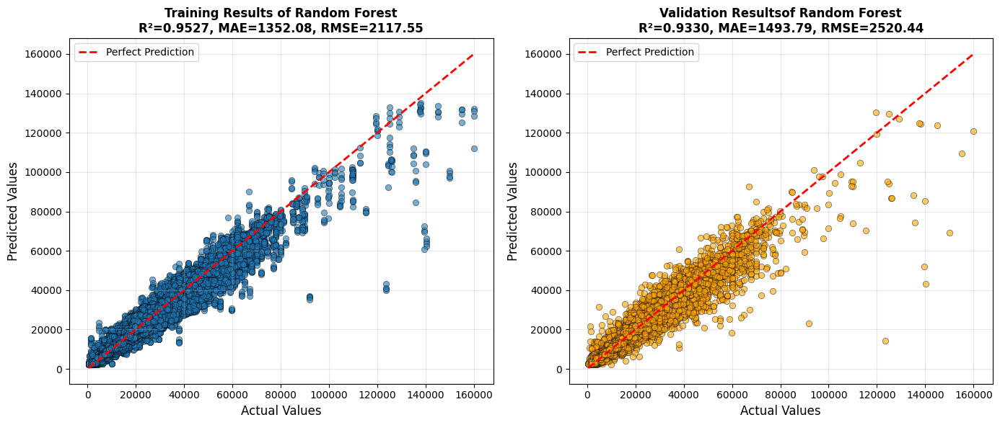

In [8]:
evaluate_best_model_with_cv(RF_tuned, X, y, model_name= "Random Forest", cv=5)

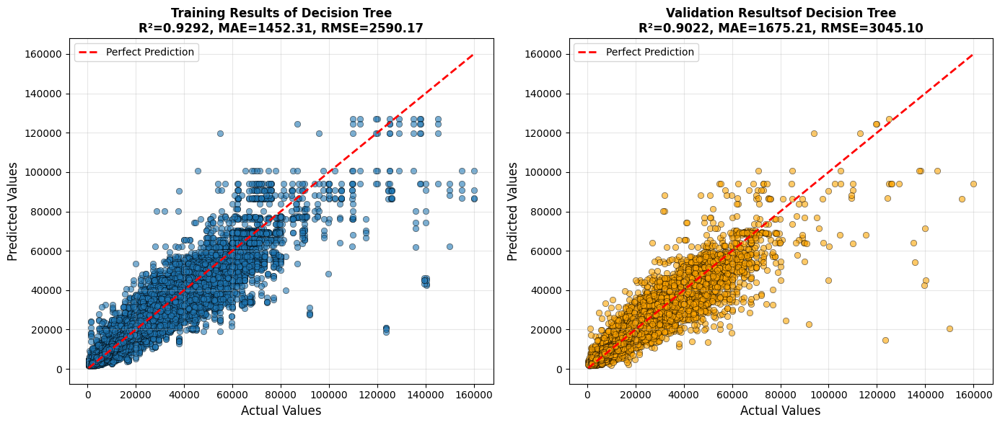

In [10]:
evaluate_best_model_with_cv(DT_tuned, X, y,model_name= "Decision Tree", cv=5)

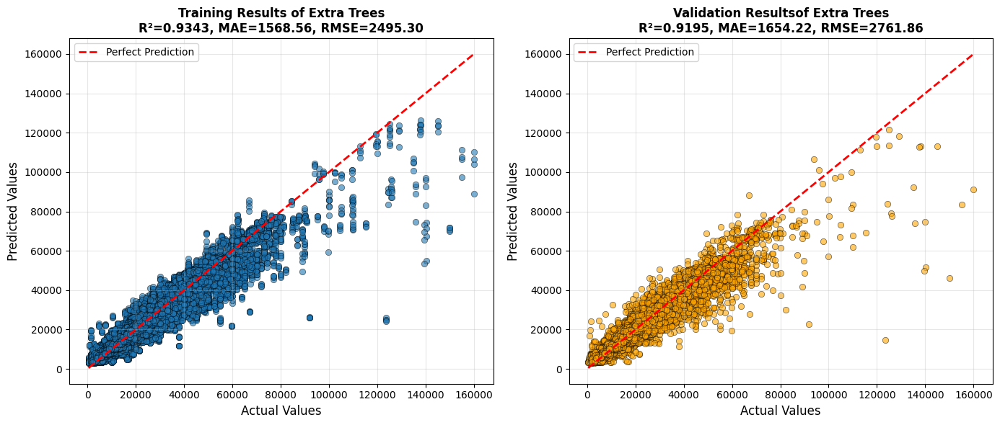

In [11]:
evaluate_best_model_with_cv(ET_tuned, X, y,model_name= "Extra Trees", cv=5)

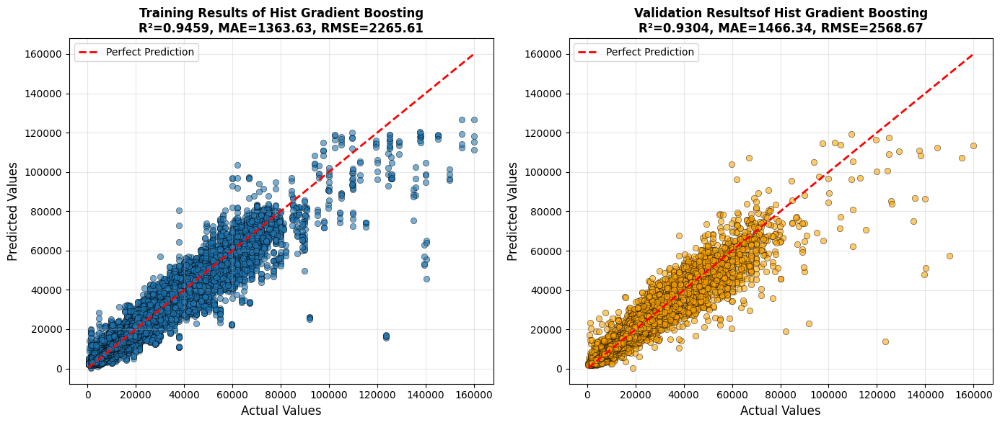

In [12]:
evaluate_best_model_with_cv(HGB_tuned, X, y,model_name= "Hist Gradient Boosting", cv=5)

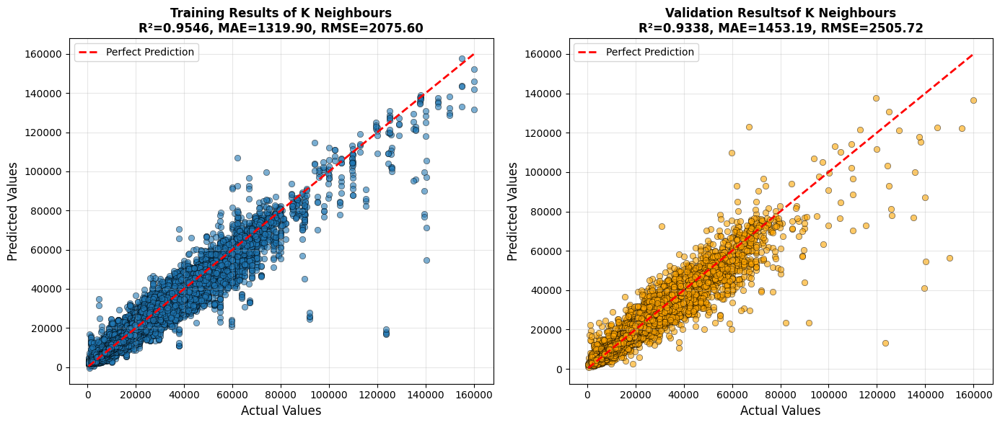

In [13]:
evaluate_best_model_with_cv(KN_tuned, X, y,model_name= "K Neighbours", cv=5)

# Random Search

In [ ]:
rf = RandomForestRegressor()

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           rf)

parameters = {
    
    # Random Forest
    
              "imputer__imputation_method": ["knn_modelwise","simple"],
              "imputer__knn_neighbors": np.arange(15,21),
              "imputer__knn_scaling_method" : ["standard", "minmax", "robust"],
              "outlier_remover__outlier_method" : ["IQR"],
              "outlier_remover__mod_outliers_cols" : [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
              "outlier_remover__sev_outliers_cols" : [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
              "outlier_remover__threshold" : [2,3],
              "outlier_remover__z_columns" : [["car_age", "mileage", "tax", "mpg"]],
              "outlier_remover__log_columns" : [["car_age", "mileage", "tax", "mpg", "engineSize"]],
              "outlier_remover__contamination_IF" : [0.15, 0.3, 0.5],
              "outlier_remover__n_neighbors": [30, 50, 70],
              "outlier_remover__contamination_LOF" : [0.15, 0.3, 0.5],
              "outlier_remover__model_columns" : [["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
              "encoder__method" : ["target"],
              "scaler__scaler_name" : ["robust", "minmax", "standard"],
              "selector__selection_method": ["kbest", "model", "rfe"],
              "selector__k": np.arange(10,25),
              "selector__model_name" : ["rf"],
              "selector__n_features_to_select": np.arange(10,25),
              "model": [rf],
              "model__criterion" : ["squared_error", "absolute_error", "friedman_mse", "poisson"],
              "model__n_estimators" : np.arange(100, 130, 10),
              "model__max_depth": np.arange(10, 50, 5),
              "model__max_features" : ['sqrt', 'log2', 0.5, 0.8, 1.0],
              "model__min_impurity_decrease" : [0.2, 0.3, 0.5],
              "model__min_samples_split" : np.arange(2, 200, 15),
              "model__max_samples" : [0.3, 0.5, 0.8, None],
              "model__min_samples_leaf" : np.arange(15, 70, 5)
}

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

random_search = RandomizedSearchCV(pipeline, parameters, 
                                      n_iter= 50,
                                      scoring= mae_scorer, 
                                      verbose = 3, 
                                      refit = "mae_scorer",
                                      cv = 5, 
                                      n_jobs= 4)

In [11]:
random_search.fit(X, y)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=10. All the features will be returned.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=10. All the features will be returned.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=10. All the features will be returned.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=10. All the features will be returned.
  warnings.warn(


[CV 3/5] END encoder__method=target, imputer__imputation_method=knn_modelwise, imputer__knn_neighbors=19, imputer__knn_scaling_method=standard, model=RandomForestRegressor(), model__criterion=friedman_mse, model__max_depth=45, model__max_features=sqrt, model__max_samples=0.8, model__min_impurity_decrease=0.5, model__min_samples_leaf=25, model__min_samples_split=122, model__n_estimators=110, outlier_remover__contamination_IF=0.3, outlier_remover__contamination_LOF=0.3, outlier_remover__log_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=50, outlier_remover__outlier_method=IQR, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=13, selector__model_name=rf, selec

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=10. All the features will be returned.
  warnings.warn(


[CV 5/5] END encoder__method=target, imputer__imputation_method=knn_modelwise, imputer__knn_neighbors=19, imputer__knn_scaling_method=standard, model=RandomForestRegressor(), model__criterion=friedman_mse, model__max_depth=45, model__max_features=sqrt, model__max_samples=0.8, model__min_impurity_decrease=0.5, model__min_samples_leaf=25, model__min_samples_split=122, model__n_estimators=110, outlier_remover__contamination_IF=0.3, outlier_remover__contamination_LOF=0.3, outlier_remover__log_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=50, outlier_remover__outlier_method=IQR, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=13, selector__model_name=rf, selec

KeyboardInterrupt: 

# Random Search Analysis

In [ ]:
RS_1st_run = pd.read_csv("../data/RS_1st_run.csv")
RS_1st_run_model = joblib.load('models/RS_1st_run_model.pkl')

In [42]:
RS_1st_run[[ "params", "mean_test_score", "rank_test_score", "mean_fit_time", "mean_score_time"]].sort_values(by="rank_test_score", ascending= True).head()

,params,mean_test_score,rank_test_score,mean_fit_time,mean_score_time
34,"{'selector__selection_method': 'kbest', 'selec...",-1838.866788,1,15.366155,1.385222
38,"{'selector__selection_method': 'model', 'selec...",-1897.846030,2,33.744036,0.406251
23,"{'selector__selection_method': 'rfe', 'selecto...",-2063.797577,3,129.418633,1.224519
47,"{'selector__selection_method': 'kbest', 'selec...",-2074.151215,4,25.925015,1.503908
28,"{'selector__selection_method': 'kbest', 'selec...",-2093.409903,5,7.987908,1.155342


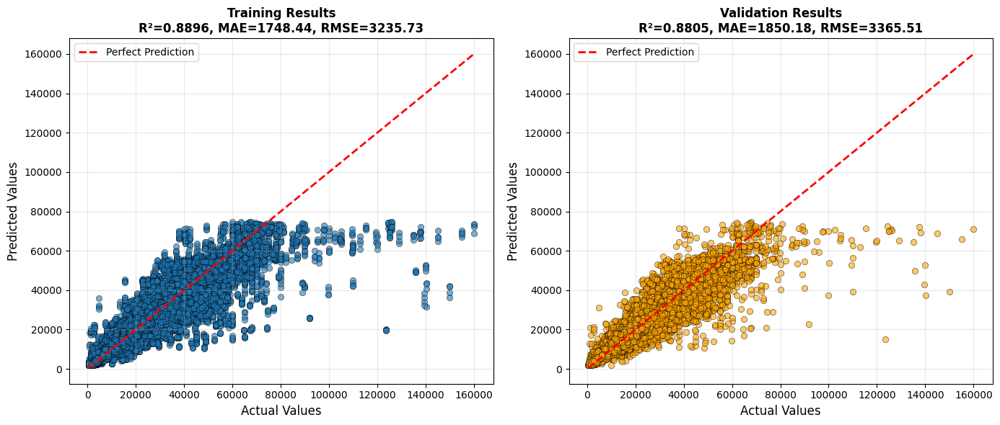

In [31]:
evaluate_best_model_with_cv(RS_1st_run_model, X, y, cv=5)

# Delivery

In [ ]:
#best_model = random_search.best_estimator_

In [ ]:
#best_model.predict(X)


array([18214.59726606, 19436.74635258, 19363.97846042, ...,
       13213.51380654, 23101.50857853, 10346.43375815])